# Identify unknown neuronal clusters and make pseudo-replicates

In [1]:
.libPaths(c(file.path(Sys.getenv("CONDA_PREFIX"), "lib/R/library"), .libPaths()))


In [2]:
library(utils)
library(monocle)

Loading required package: Matrix

Loading required package: Biobase

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bioconductor, see
    'citation("Biobase")', and for packages 'citation("pkgname")'.


Loading required package: ggplot2

Loading required package: VGAM

Loading required package: stats4

Loading re

In [12]:
cds <- readRDS("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:31/cds.rds")

In [14]:
cds <- cds[,cds$batch != '20230925']

In [99]:
#only using the unannatated cell types
#cds <- cds[,cds$all_celltype != 'Unannotated']

In [15]:
dim(pData(cds))

[1] 722760     69

In [13]:
#only using the unannatated neuronal cell types
#cds <- cds[,cds$main_celltype == 'Neuron']

In [21]:
wtzt <- cds[,(cds$light_condition == "LD") & (cds$genotype == "Wild-type")]
wtct <- cds[,(cds$light_condition == "DD") & (cds$genotype == "Wild-type")]
mtzt <- cds[,(cds$light_condition == "LD") & (cds$genotype == "per0")]
mtct <- cds[,(cds$light_condition == "DD") & (cds$genotype == "per0")]

In [127]:
dim(pData(wtzt))
dim(pData(wtct))
dim(pData(mtzt))
dim(pData(mtct))

[1] 339092     69

[1] 224697     69

[1] 125855     69

[1] 33116    69

In [8]:
unique(cds$final_Conditions)
unique(cds$timepoint)
cds$final_timepoints <- sub(".*(ZT\\d+).*", "\\1", cds$final_Conditions)
cds$final_timepoints <- sub(".*(CT\\d+).*", "\\1", cds$final_timepoints)
unique(cds$final_timepoints)
unique(cds$replicate)
cds$pseudo_replicate <- NA

[1] "MT_Mal_ZT20_2" "MT_Mal_ZT0_2"  "WT_Fem_CT16_1" "MT_Fem_ZT4_1" 
 [5] "MT_Fem_ZT0_1"  "WT_Mal_CT12_1" "MT_Mal_ZT16_1" "MT_Fem_CT0_1" 
 [9] "MT_Mal_ZT8_2"  "WT_Fem_CT4_1"  "MT_Fem_ZT12_1" "WT_Mal_CT20_1"
[13] "MT_Mal_ZT12_1" "WT_Fem_CT8_1"  "WT_Mal_CT4_1"  "MT_Mal_ZT4_1" 
[17] "MT_Fem_ZT8_2"  "MT_Mal_CT0_1"  "WT_Mal_CT0_1"  "MT_Fem_CT8_1" 
[21] "MT_Fem_CT16_1" "MT_Fem_ZT4_2"  "WT_Mal_CT8_1"  "MT_Mal_CT20_1"
[25] "MT_Fem_CT4_1"  "MT_Mal_CT8_1"  "MT_Mal_CT16_1" "MT_Fem_ZT12_2"
[29] "MT_Fem_ZT16_1" "MT_Mal_ZT16_2" "MT_Fem_ZT8_1"  "MT_Mal_ZT0_1" 
[33] "MT_Mal_ZT20_1" "MT_Fem_ZT0_2"  "MT_Mal_CT4_1"  "MT_Fem_CT20_1"
[37] "WT_Fem_CT12_1" "MT_Mal_ZT8_1"  "WT_Fem_CT0_1"  "WT_Fem_CT20_1"
[41] "MT_Mal_ZT12_2" "MT_Mal_ZT4_2"  "MT_Fem_ZT16_2" "WT_Mal_CT16_1"
[45] "MT_Fem_ZT20_1" "MT_Fem_CT12_1" "MT_Fem_ZT20_2" "MT_Mal_CT12_1"
[49] "WT_Mal_ZT8_1"  "WT_Fem_ZT16_2" "WT_Fem_ZT12_1" "WT_Fem_ZT12_2"
[53] "WT_Mal_ZT20_1" "WT_Mal_ZT8_2"  "WT_Fem_ZT4_1"  "WT_Fem_ZT8_1" 
[57] "WT_Mal_ZT20_2" "WT_Mal_ZT16_1" "WT_Mal_ZT12_2" "WT_Mal_ZT0_1" 
[61] "WT_Mal_ZT4_1"  "WT_Mal_ZT16_2" "WT_Fem_ZT8_2"  "WT_Fem_ZT20_2"
[65] "WT_Fem_ZT20_1" "WT_Fem_ZT0_1"  "WT_Mal_ZT12_1" "WT_Fem_ZT16_1"
[69] "WT_Mal_ZT4_2"  "WT_Fem_ZT4_2"  "WT_Mal_ZT0_2"  "WT_Fem_ZT0_2" 
[73] "WT_Mix_ZT8_1"  "WT_Mix_ZT16_1" "WT_Mix_ZT12_1" "MT_Mix_ZT4_2" 
[77] "MT_Mix_ZT20_1" "MT_Mix_ZT0_2"  "MT_Mix_ZT8_2"  "WT_Mix_ZT0_2" 
[81] "WT_Mix_ZT20_1" "MT_Mix_ZT20_2" "WT_Mix_ZT8_2"  "MT_Mix_ZT16_1"
[85] "MT_Mix_ZT16_2" "MT_Mix_ZT0_1"  "WT_Mix_ZT0_1"  "MT_Mix_ZT12_2"
[89] "WT_Mix_ZT12_2" "MT_Mix_ZT4_1"  "MT_Mix_ZT12_1" "MT_Mix_ZT8_1" 
[93] "WT_Mix_ZT4_2"  "WT_Mix_ZT20_2" "WT_Mix_ZT16_2" "WT_Mix_ZT4_1"

[1] 44 24 16  4  0 12 32 20  8 28 36 40

[1] "ZT20" "ZT0"  "CT16" "ZT4"  "CT12" "ZT16" "CT0"  "ZT8"  "CT4"  "ZT12"
[11] "CT20" "CT8"

[1] 2 1

In [134]:
cds <- wtzt

In [9]:
## NEED TO DO THIS SEPARATELY FOR WT LD, WT DD, MT LD, AND MT DD
# Set the number of desired replicates (Sum & Split)
number_of_replicates <- 2

# Ensure equal splitting of cells by 'Sum' and 'unsup_celltype'
cds$pseudo_replicate <- ave(cds$final_timepoints, cds$final_timepoints, cds$leiden_res_0.03_main, FUN = function(x) {
  # For each combination of 'Sum' and 'unsup_celltype', split into 2 pseudo-replicates
  n <- length(x)
  if (n == 1) {
    # If there's only one cell, assign it to replicate 1
    return(paste0(x, "_1"))
  } else {
    # If more than one cell, assign cells as evenly as possible to the 2 replicates
    replicate_ids <- rep(1:number_of_replicates, length.out = n)
    replicate_ids <- sample(replicate_ids)  # Randomize the assignment
    return(paste0(x, "_", replicate_ids))
  }
})

str(cds$final_timepoints)
str(cds$all_celltype)
str(cds$pseudo_replicate)

 chr [1:722760] "ZT20" "ZT0" "CT16" "ZT4" "ZT0" "CT12" "ZT16" "CT0" "ZT8" ...
 chr [1:722760] "Unannotated" "Tm5a" "R1-6" "Unannotated" "Unannotated" ...
 chr [1:722760] "ZT20_2" "ZT0_1" "CT16_1" "ZT4_1" "ZT0_2" "CT12_1" "ZT16_1" ...


# MetaCycle2D master

In [10]:
# ---- MetaCycle by cluster with per-cluster checkpointing ----
library(dplyr)
library(Matrix)
library(Matrix.utils)   # fast aggregation
library(matrixStats)
library(MetaCycle)

# ---------- PARAMETERS ----------
median_threshold      <- 1.0
fold_change_threshold <- 1.0
period                <- 24                 # hours
methods               <- c("JTK","ARS","LS")
time_prefix           <- ""                 # if you want "ZT"/"CT" in labels
output_base           <- "MetaCycle_all_conditions_checkpointed"
replicates            <- 1                # set to 1:3 for three runs

# ---------- HELPERS ----------
`%||%` <- function(a, b) if (!is.null(a)) a else b

normalize_counts <- function(mat) {
  # CPM + log1p; keep as base matrix for speed with log1p
  cs <- colSums(mat)
  cs[cs == 0] <- 1
  log1p(t(t(mat) / cs) * 1e6)
}

count_sig <- function(tbl, candidates = c("BH.Q","JTK.ADJP","ARS.BH.Q","LS.BH.Q","ADJ.P")) {
  if (is.null(tbl)) return(NA_integer_)
  nm <- names(tbl)
  pcol <- candidates[candidates %in% nm][1]
  if (is.na(pcol)) return(NA_integer_)
  sum(tbl[[pcol]] < 0.05, na.rm = TRUE)
}

# ---------- DEFINE CONDITIONS ----------
cds_list <- list(
  WT_LD = cds[, cds$light_condition == "LD" & cds$genotype == "Wild-type"],
  WT_DD = cds[, cds$light_condition == "DD" & cds$genotype == "Wild-type"],
  MT_LD = cds[, cds$light_condition == "LD" & cds$genotype == "per0"     ],
  MT_DD = cds[, cds$light_condition == "DD" & cds$genotype == "per0"     ]
)

for (run_id in replicates) {
  set.seed(1000 + run_id)  # reproducible split per run
  message("=== Starting replicate ", run_id, " ===")

  for (cond in names(cds_list)) {
    message(" → Condition: ", cond)
    cds_sub  <- cds_list[[cond]]
    expr_mat <- exprs(cds_sub)                 # genes x cells (dgCMatrix)
    md       <- pData(cds_sub)
    stopifnot("timepoint" %in% colnames(md))

    # output & checkpoint file for this condition/replicate
    out_dir       <- file.path(output_base, sprintf("%s_rep%d", cond, run_id))
    dir.create(out_dir, recursive = TRUE, showWarnings = FALSE)
    summary_path  <- file.path(out_dir, sprintf("summary_%s_rep%d.csv", cond, run_id))

    # what’s already done?
    done_keys <- character(0)
    if (file.exists(summary_path)) {
      prev <- tryCatch(read.csv(summary_path, stringsAsFactors = FALSE), error = function(e) NULL)
      if (!is.null(prev) && nrow(prev)) {
        done_keys <- paste(prev$resolution, prev$cluster, sep = "||")
      }
    }

    res_cols <- grep("leiden_res_.*_(main|neuron)$", colnames(md), value = TRUE)

    for (res in res_cols) {
      message("   • resolution: ", res)
      clu_all <- as.character(md[[res]])
      tp_all  <- md$timepoint
      valid   <- !is.na(clu_all) & !is.na(tp_all)
      clu     <- clu_all[valid]
      tp      <- tp_all[valid]

      if (!length(clu)) next

      # pseudo-replicates: split each (cluster, timepoint) evenly into 1 or 2
      rep_id <- ave(tp, tp, clu, FUN = function(x) {
        ids <- rep(1:2, length.out = length(x))
        sample(ids)
      })
      new_tp <- ifelse(rep_id == 1, tp, tp + period)   # 0→0 & 24; 4→4 & 28, etc.
      tp_lbl <- paste0(time_prefix, new_tp)

      # group label = cluster_time
      grp_ct <- paste0(clu, "_", tp_lbl)
      # fast pseudobulk: sum counts per group (keeps sparse)
      # aggregate.Matrix aggregates rows; so aggregate on t(expr) then transpose back
      agg_ct <- t(aggregate.Matrix(t(expr_mat[, valid, drop = FALSE]),
                                   groupings = as.factor(grp_ct),
                                   fun = "sum"))
      # enforce full grid cluster×time (zero-fill)
      clusters <- sort(unique(clu))
      times_u  <- sort(unique(tp_lbl))
      full_cols <- as.vector(outer(clusters, times_u, paste, sep = "_"))
      miss <- setdiff(full_cols, colnames(agg_ct))
      if (length(miss)) {
        z <- Matrix(0, nrow = nrow(agg_ct), ncol = length(miss),
                    dimnames = list(rownames(agg_ct), miss), sparse = TRUE)
        agg_ct <- cbind(agg_ct, z)
      }
      agg_ct <- agg_ct[, full_cols, drop = FALSE]

      # filter genes (median + fold change) before normalization
      med <- rowMedians(as.matrix(agg_ct))
      mx  <- rowMaxs(as.matrix(agg_ct))
      mn  <- rowMins(as.matrix(agg_ct)); mn[mn == 0] <- 1e-10
      keep <- (med >= median_threshold) & ((mx / mn) >= fold_change_threshold)
      if (!any(keep)) next
      agg_f <- as.matrix(agg_ct[keep, , drop = FALSE])

      # normalize CPM + log1p
      agg_norm <- normalize_counts(agg_f)

      # run MetaCycle per cluster; write one row per cluster immediately
      for (cl in clusters) {
        key <- paste(res, cl, sep = "||")
        if (key %in% done_keys) next

        cols <- grep(paste0("^", cl, "_[0-9]+$"), colnames(agg_norm), value = TRUE)
        if (!length(cols)) next
        times_num <- as.numeric(sub(paste0("^", cl, "_"), "", cols))
        ord       <- order(times_num)
        tpts      <- times_num[ord]
        mat_cl    <- agg_norm[, cols[ord], drop = FALSE]

        # require at least 6 distinct timepoints for 24 h at 4 h step
        if (length(unique(tpts)) < 6 || ncol(mat_cl) < 6) next

        df_in <- data.frame(Gene = rownames(mat_cl), mat_cl, check.names = FALSE)

        mc <- tryCatch(
          meta2d(
            infile     = "inmemory",
            inDF       = df_in,
            outdir     = tempdir(),
            filestyle  = "txt",
            timepoints = tpts,
            cycMethod  = methods,
            outputFile = FALSE,
            minper     = period,
            maxper     = period
          ),
          error = function(e) {
            warning("meta2d error for ", cond, "/", res, "/", cl, ": ", e$message)
            NULL
          }
        )

        # robust column handling across MetaCycle versions
        n_jtk  <- count_sig(mc$JTK, c("BH.Q","JTK.ADJP","ADJ.P"))
        n_ars  <- count_sig(mc$ARS, c("BH.Q","ARS.BH.Q","ADJ.P"))
        n_ls   <- count_sig(mc$LS,  c("BH.Q","LS.BH.Q","ADJ.P"))
        meta_t <- mc$meta %||% mc$meta2d
        n_meta <- if (!is.null(meta_t) && "meta2d_pvalue" %in% names(meta_t))
                    sum(meta_t$meta2d_pvalue < 0.05, na.rm = TRUE) else NA_integer_

        row <- data.frame(
          condition  = cond,
          replicate  = run_id,
          resolution = res,
          cluster    = cl,
          n_meta2d   = n_meta,
          stringsAsFactors = FALSE
        )

        # append immediately (checkpoint)
        write.table(
          row, file = summary_path, sep = ",", row.names = FALSE,
          col.names = !file.exists(summary_path), append = TRUE, quote = FALSE
        )
        done_keys <- c(done_keys, key)
      } # end cluster loop
    }   # end resolution loop

    message("   ✓ wrote/updated ", summary_path)
  }     # end condition loop
}       # end replicate loop

message("★ All replicates & conditions complete ★")



Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count


The following objects are masked from ‘package:Biobase’:

    anyMissing, rowMedians


=== Starting replicate 1 ===

 → Condition: WT_LD

   • resolution: leiden_res_4.00_main

   • resolution: leiden_res_0.60_main

   • resolution: leiden_res_0.10_main

   • resolution: leiden_res_0.03_main

   • resolution: leiden_res_8.00_main

   • resolution: leiden_res_2.00_main

   • resolution: leiden_res_4.00_neuron

   • resolution: leiden_res_6.00_neuron

   • resolution: leiden_res_8.00_neuron

   • resolution: leiden_res_10.00_neuron

   • resolution: leiden_res_14.00_neuron

   • resolution: leiden_res_18.00_neuron

   • resolution: leiden_res_20.00_neuron



In [12]:
library(dplyr)
library(readr)
library(purrr)
library(tidyr)
library(stringr)

options(dplyr.summarise.inform = FALSE)

# ----- SETTINGS -----
output_base   <- "MetaCycle_all_conditions_checkpointed"
replicates    <- 1:3                              # the replicate IDs you expect
conds         <- c("WT_LD","WT_DD","MT_LD","MT_DD")
use_hits_col  <- "n_meta2d"                       # which column is "hits" in summary csvs
aggregate_fun <- "mean"                           # one of: "mean","median","sum"
write_debug   <- TRUE

# Helper to pick aggregator
agg_fun <- switch(aggregate_fun,
  mean   = \(x) mean(x, na.rm = TRUE),
  median = \(x) median(x, na.rm = TRUE),
  sum    = \(x) sum(x, na.rm = TRUE),
  stop("aggregate_fun must be one of: mean/median/sum")
)

# ----- 0) PATHS & LOAD -----
summary_paths <- unlist(lapply(conds, function(cc) {
  lapply(replicates, function(r) {
    file.path(output_base, sprintf("%s_rep%d", cc, r),
              sprintf("summary_%s_rep%d.csv", cc, r))
  })
}), use.names = FALSE)

summary_paths <- summary_paths[file.exists(summary_paths)]
stopifnot(length(summary_paths) > 0)

read_one <- function(p) {
  out <- suppressMessages(read_csv(p, show_col_types = FALSE))
  # Ensure required columns exist
  need <- c("condition","resolution","cluster","replicate",
            "n_meta2d")
  # If replicate missing in file, infer from path "...rep<d>"
  if (!"replicate" %in% names(out)) {
    rep_id <- as.integer(stringr::str_match(basename(p), "rep(\\d+)")[,2])
    out$replicate <- rep_id
  }
  # Coerce types & keep only what we need
  out %>%
    transmute(
      condition  = as.character(condition),
      resolution = as.character(resolution),
      cluster    = as.character(cluster),
      replicate  = as.integer(replicate),
      n_meta2d   = as.numeric(n_meta2d)
    )
}

df_sum_raw <- set_names(summary_paths) |>
  map_df(read_one, .id = "path") |>
  # drop neuron "NaN" pseudo-clusters that come from non-neuronal cells
  filter(!is.na(cluster), cluster != "", tolower(cluster) != "nan")

# ----- 1) HARMONIZE RESOLUTION LABELS -----
# Accept either "leiden_res_8.00_neuron" or "8_00_neuron" and convert to the former.
harmonize_res <- function(x) {
  # If pattern like "8_00_neuron", convert to "leiden_res_8.00_neuron"
  ix <- grepl("^[0-9]+_[0-9]{2}_(main|neuron)$", x)
  x[ix] <- sub("^([0-9]+)_([0-9]{2})_(.*)$", "leiden_res_\\1.\\2_\\3", x[ix])
  x
}
df_sum_raw$resolution <- harmonize_res(df_sum_raw$resolution)

# (Optional) de-dup in case of partial retries
df_sum_raw <- df_sum_raw |>
  distinct(condition, replicate, resolution, cluster, .keep_all = TRUE)

# ----- 2) COMPLETE REPLICATE GRID (missing reps -> 0) -----
df_sum_complete <- df_sum_raw |>
  group_by(condition, resolution, cluster) |>
  tidyr::complete(
    replicate = replicates,
    fill = list(n_meta2d = 0)
  ) |>
  ungroup()

# Track how many reps actually present before completion
df_found <- df_sum_raw |>
  group_by(condition, resolution, cluster) |>
  summarise(n_reps_found = n_distinct(replicate), .groups = "drop")

# ----- 3) AGGREGATE REPLICATES (sum & mean; choose which to use) -----
df_hits <- df_sum_complete |>
  group_by(condition, resolution, cluster) |>
  summarise(
    n_meta2d_sum = sum(n_meta2d, na.rm = TRUE),
    n_meta2d_mean = mean(n_meta2d, na.rm = TRUE),
    n_reps        = length(replicates),      # expected reps
    .groups = "drop"
  ) |>
  left_join(df_found, by = c("condition","resolution","cluster"))

# Choose the aggregate to serve as the canonical "n_*" columns
use_suffix <- switch(aggregate_fun,
  mean = "_mean", median = "_mean", sum = "_sum")  # median not meaningful for *_sum; we still expose *_mean and *_sum
df_hits <- df_hits |>
  transmute(
    condition, resolution, cluster,
    n_meta2d = if (aggregate_fun == "sum") n_meta2d_sum else n_meta2d_mean,
    # keep both for transparency
    n_meta2d_sum, n_meta2d_mean,
    n_reps, n_reps_found
  ) |>
  rename(n_rhythmic = n_meta2d)  # <- canonical aggregate used downstream
      
# ----- 4) REBUILD CELL COUNTS FROM CDS -----
# expects a Monocle "cds" in the environment
count_cells_for_cond <- function(cds_sub, cond_label) {
  md <- Biobase::pData(cds_sub)
  res_cols <- grep("leiden_res_.*_(main|neuron)$", colnames(md), value = TRUE)

  bind_rows(lapply(res_cols, function(res) {
    x <- md[[res]]
    if (is.numeric(x)) {
      keep <- is.finite(x); clu <- as.character(x[keep])
    } else {
      xs   <- as.character(x)
      keep <- !is.na(xs) & xs != "" & tolower(xs) != "nan"
      clu  <- xs[keep]
    }
    if (length(clu) == 0) {
      return(tibble::tibble(condition=character(0), resolution=character(0),
                            cluster=character(0), n_cells=integer(0)))
    }
    df <- tibble::tibble(condition = cond_label, resolution = res, cluster = clu)
    dplyr::count(df, condition, resolution, cluster, name = "n_cells")
  }))
}

wtzt <- cds[, cds$light_condition=="LD" & cds$genotype=="Wild-type"]
wtct <- cds[, cds$light_condition=="DD" & cds$genotype=="Wild-type"]
mtzt <- cds[, cds$light_condition=="LD" & cds$genotype=="per0"     ]
mtct <- cds[, cds$light_condition=="DD" & cds$genotype=="per0"     ]

df_cells <- bind_rows(
  count_cells_for_cond(wtzt, "WT_LD"),
  count_cells_for_cond(wtct, "WT_DD"),
  count_cells_for_cond(mtzt, "MT_LD"),
  count_cells_for_cond(mtct, "MT_DD")
)

# ----- 5) JOIN & SCORE VIA GLOBAL LOG–LOG RESIDUALS -----
df_join <- df_cells |>
  full_join(df_hits, by = c("condition","resolution","cluster")) |>
  mutate(
    n_cells    = replace_na(n_cells, 0),
    n_rhythmic = replace_na(n_rhythmic, 0)
  )

# model only on clusters with cells
df_model <- df_join |>
  filter(n_cells > 0) |>
  mutate(
    log_n_cells    = log10(n_cells),
    log_n_rhythmic = log10(n_rhythmic + 1)
  )

fit <- lm(log_n_rhythmic ~ log_n_cells, data = df_model)

df_scored <- df_model |>
  mutate(
    rhythmicity_resid = resid(fit),
    expected_rhythmic = 10^predict(fit, newdata = df_model) - 1,
    excess_rhythmic   = n_rhythmic - expected_rhythmic
  )

# ----- 6) WRITE OUTPUTS -----
dir.create(output_base, showWarnings = FALSE, recursive = TRUE)

write_csv(df_join,   file.path(output_base, "all_clusters_counts_and_hits.csv"))
write_csv(df_scored, file.path(output_base, "all_clusters_rhythmicity_scores.csv"))

cat("Wrote:\n",
    file.path(output_base, "all_clusters_counts_and_hits.csv"), "\n",
    file.path(output_base, "all_clusters_rhythmicity_scores.csv"), "\n")

if (write_debug) {
  # a small sanity snapshot
  chk <- df_hits %>%
    group_by(condition) %>%
    summarise(
      clusters = n(),
      reps_expected = first(n_reps),
      reps_found_min = min(n_reps_found, na.rm=TRUE),
      reps_found_max = max(n_reps_found, na.rm=TRUE),
      total_n_rhyth_sum = sum(n_meta2d_sum, na.rm=TRUE),
      total_n_rhyth_mean = sum(n_meta2d_mean, na.rm=TRUE)
    )
  print(chk, n=Inf)
}


Wrote:
 MetaCycle_all_conditions_checkpointed/all_clusters_counts_and_hits.csv 
 MetaCycle_all_conditions_checkpointed/all_clusters_rhythmicity_scores.csv 
# A tibble: 4 × 7
  condition clusters reps_expected reps_found_min reps_found_max
  <chr>        <int>         <int>          <int>          <int>
1 MT_DD         3671             3              3              3
2 MT_LD         6013             3              3              3
3 WT_DD         9120             3              3              3
4 WT_LD         9142             3              3              3
# ℹ 2 more variables: total_n_rhyth_sum <dbl>, total_n_rhyth_mean <dbl>


# Find out ways to calculate the rhythmicity scores

In [13]:
rhythmic_genes_WTLD <- readRDS("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:31/cell_type_subdata_list_WT_LD.rds")
rhythmic_genes_WTDD <- readRDS("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:31/cell_type_subdata_list_WT_DD.rds")
rhythmic_genes_MTLD <- readRDS("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:31/cell_type_subdata_list_MT_LD.rds")
rhythmic_genes_MTDD <- readRDS("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:31/cell_type_subdata_list_MT_DD.rds")

In [15]:
# 1) Put your cds subsets and rhythmic-gene data.frames into named lists
cds_list <- list(
  WT_LD = wtzt,
  WT_DD = wtct,
  MT_LD = mtzt,
  MT_DD = mtct
)
rhythmic_lists <- list(
  WT_LD = rhythmic_genes_WTLD,
  WT_DD = rhythmic_genes_WTDD,
  MT_LD = rhythmic_genes_MTLD,
  MT_DD = rhythmic_genes_MTDD
)

# 2) Cell counts per (condition, cell_type)
cell_counts_df <- do.call(rbind, lapply(names(cds_list), function(cond) {
  cds_sub <- cds_list[[cond]]
  ct_tab  <- table(as.character(cds_sub$all_celltype))
  data.frame(
    condition = cond,
    cell_type = names(ct_tab),
    n_cells   = as.integer(ct_tab),
    stringsAsFactors = FALSE
  )
}))

# 3) Rhythmic gene counts per (condition, cell_type)
rhythmic_counts_df <- do.call(rbind, lapply(names(rhythmic_lists), function(cond) {
  df <- rhythmic_lists[[cond]]
  ct_tab <- table(as.character(df$cell_type))
  data.frame(
    condition  = cond,
    cell_type  = names(ct_tab),
    n_rhythmic = as.integer(ct_tab),
    stringsAsFactors = FALSE
  )
}))

# 4) Merge and compute score
df_scores <- merge(
  rhythmic_counts_df,
  cell_counts_df,
  by = c("condition", "cell_type"),
  all = FALSE  # equivalent to inner join: keeps only matching rows
)
df_scores$rhythmicity_score <- df_scores$n_rhythmic / df_scores$n_cells


# 5) Check for any still-missing
if (any(is.na(df_scores$n_cells))) {
  warning("These combinations had no matching cells:\n",
          paste0(utils::capture.output(
            df_scores[is.na(df_scores$n_cells), c("condition", "cell_type")]
          ), collapse = "\n"))
}

# 6) Write out
write.csv(df_scores, "rhythmicity_scores.csv", row.names = FALSE)


In [16]:
print(head(df_scores))

  condition cell_type n_rhythmic n_cells rhythmicity_score
1     MT_DD     AL-PN         16      40        0.40000000
2     MT_DD       ALG         33     273        0.12087912
3     MT_DD        C2         31     331        0.09365559
4     MT_DD        C3         38     313        0.12140575
5     MT_DD        CG         34     171        0.19883041
6     MT_DD       CHG         11     106        0.10377358


## Regression-Residual Score

In [17]:
# assume df_scores has columns: condition, cell_type, n_cells, n_rhythmic
# add a log10 version (avoids heteroskedasticity)
df_scores <- df_scores %>%
  mutate(
    log_n_cells    = log10(n_cells),
    log_n_rhythmic = log10(n_rhythmic + 1)    # +1 to avoid log(0)
  )

# fit log–log model
fit <- lm(log_n_rhythmic ~ log_n_cells, data = df_scores)

# extract residuals as “corrected rhythm score”
df_scores$rhythmicity_resid <- resid(fit)

# you can also back-transform if you want on the original scale:
# expected = 10^(predict(fit)) – 1
df_scores$expected_rhythmic <- 10^predict(fit) - 1
df_scores$excess_rhythmic   <- df_scores$n_rhythmic - df_scores$expected_rhythmic

df_scores

condition,cell_type,n_rhythmic,n_cells,rhythmicity_score,log_n_cells,log_n_rhythmic,rhythmicity_resid,expected_rhythmic,excess_rhythmic
<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MT_DD,AL-PN,16,40,0.40000000,1.602060,1.2304489,0.192769223,9.906357,6.0936433
MT_DD,ALG,33,273,0.12087912,2.436163,1.5314789,-0.025746689,35.076600,-2.0766004
MT_DD,C2,31,331,0.09365559,2.519828,1.5051500,-0.104189103,39.676079,-8.6760789
MT_DD,C3,38,313,0.12140575,2.495544,1.5910646,-0.003148669,38.283781,-0.2837806
MT_DD,CG,34,171,0.19883041,2.232996,1.5440680,0.113390822,25.957352,8.0426484
MT_DD,CHG,11,106,0.10377358,2.025306,1.0791812,-0.222129865,19.012950,-8.0129500
MT_DD,CLKN,10,62,0.16129032,1.792392,1.0413927,-0.114840832,13.329582,-3.3295818
MT_DD,CONE-1,135,998,0.13527054,2.999131,2.1335389,0.225651830,79.888555,55.1114448
MT_DD,CONE-2,40,409,0.09779951,2.611723,1.6127839,-0.053794983,45.406503,-5.4065027


In [22]:
options(repr.plot.width = 6,
        repr.plot.height = 12,
        repr.plot.res    = 500)
   # resolution in DPI

# Make background white
par(bg = "white")


`geom_smooth()` using formula = 'y ~ x'
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Log–Log relationship of cell count vs rhythmic genes' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Log–Log relationship of cell count vs rhythmic genes' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Log–Log relationship of cell count vs rhythmic genes' in 'mbcsToSbcs': dot substituted for <93>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Global‐Norm Residual' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Global‐Norm Residual' in 'mbcsToSbcs': dot substituted for <80>”
Warning m

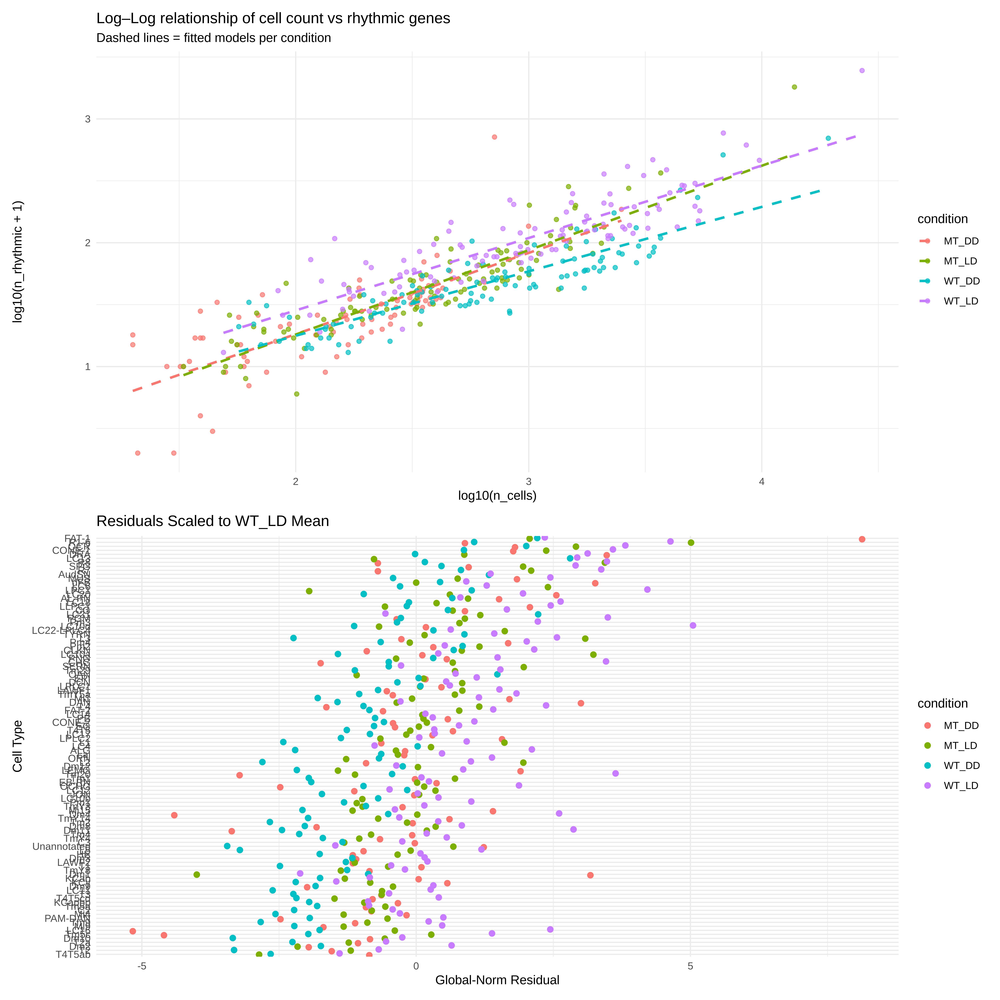

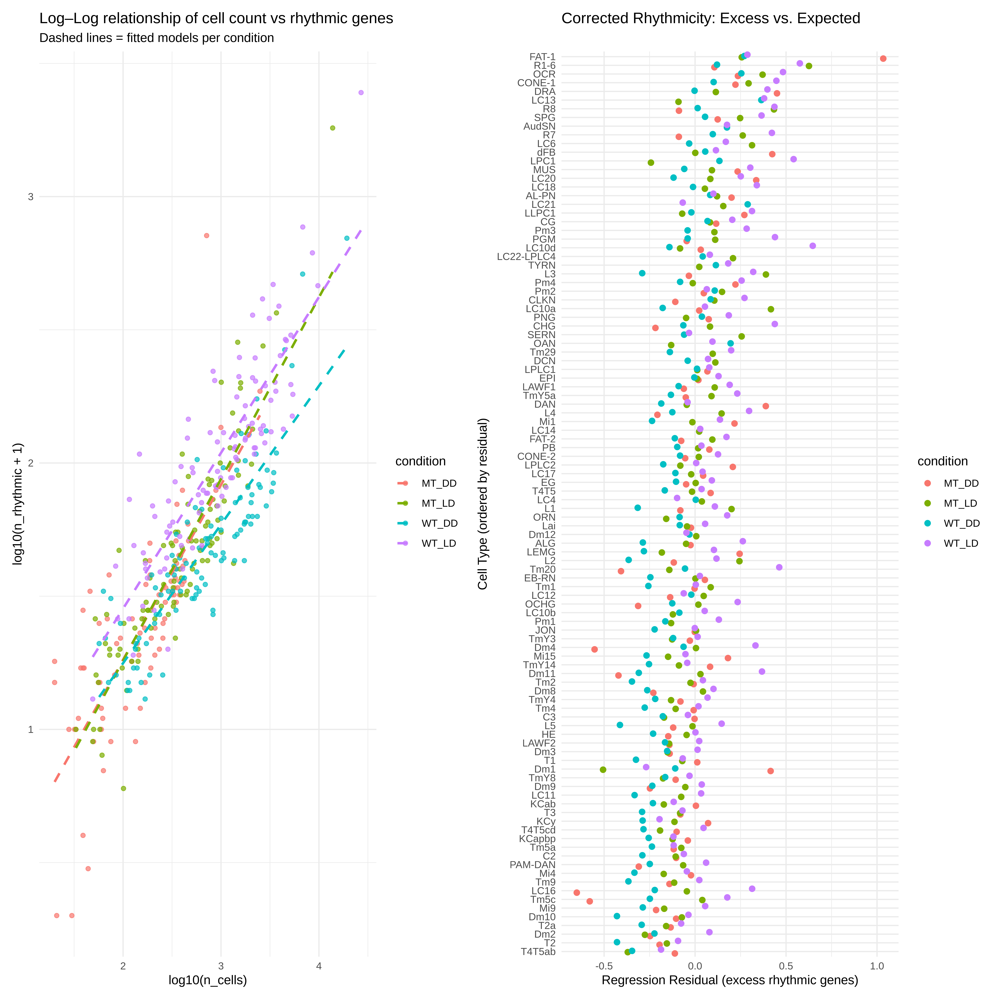

In [109]:
library(patchwork)
(p1 / p2)  # scatter over density
# or
p1 + p3 + plot_layout(ncol=2)


In [53]:
options(repr.plot.width = 12,
        repr.plot.height = 12,
        repr.plot.res    = 500)
   # resolution in DPI

# Make background white
par(bg = "white")


## Square-Root (or Power) Normalization

In [26]:
# simple variants
df_scores <- df_scores %>%
  mutate(
    score_per_sqrt  = n_rhythmic / sqrt(n_cells),
    score_per_10log = n_rhythmic / (n_cells ^ 0.5),  # same as sqrt
    score_per_4th   = n_rhythmic / (n_cells ^ 0.25)  # even gentler
  )
df_scores

condition,cell_type,n_rhythmic,n_cells,rhythmicity_score,log_n_cells,log_n_rhythmic,rhythmicity_resid,expected_rhythmic,excess_rhythmic,score_per_sqrt,score_per_10log,score_per_4th
<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MT_DD,AL-PN,16,40,0.40000000,1.602060,1.2304489,0.192769223,9.906357,6.0936433,2.5298221,2.5298221,6.362166
MT_DD,ALG,33,273,0.12087912,2.436163,1.5314789,-0.025746689,35.076600,-2.0766004,1.9972509,1.9972509,8.118453
MT_DD,C2,31,331,0.09365559,2.519828,1.5051500,-0.104189103,39.676079,-8.6760789,1.7039141,1.7039141,7.267829
MT_DD,C3,38,313,0.12140575,2.495544,1.5910646,-0.003148669,38.283781,-0.2837806,2.1478870,2.1478870,9.034362
MT_DD,CG,34,171,0.19883041,2.232996,1.5440680,0.113390822,25.957352,8.0426484,2.6000450,2.6000450,9.402209
MT_DD,CHG,11,106,0.10377358,2.025306,1.0791812,-0.222129865,19.012950,-8.0129500,1.0684144,1.0684144,3.428201
MT_DD,CLKN,10,62,0.16129032,1.792392,1.0413927,-0.114840832,13.329582,-3.3295818,1.2700013,1.2700013,3.563708
MT_DD,CONE-1,135,998,0.13527054,2.999131,2.1335389,0.225651830,79.888555,55.1114448,4.2733503,4.2733503,24.018790
MT_DD,CONE-2,40,409,0.09779951,2.611723,1.6127839,-0.053794983,45.406503,-5.4065027,1.9778727,1.9778727,8.894656


In [28]:
options(repr.plot.width = 6,
        repr.plot.height = 6,
        repr.plot.res    = 500)
   # resolution in DPI

# Make background white
par(bg = "white")


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Cell Type (ordered by √-normalized score)' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Cell Type (ordered by √-normalized score)' in 'mbcsToSbcs': dot substituted for <88>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Cell Type (ordered by √-normalized score)' in 'mbcsToSbcs': dot substituted for <9a>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Per-cell-type √-normalized rhythmicity' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Per-cell-type √-normalized rhythmicity' in 'mbcsToSbcs': dot substituted for <88>”
Warning message in grid.Call(C_textBounds, as.

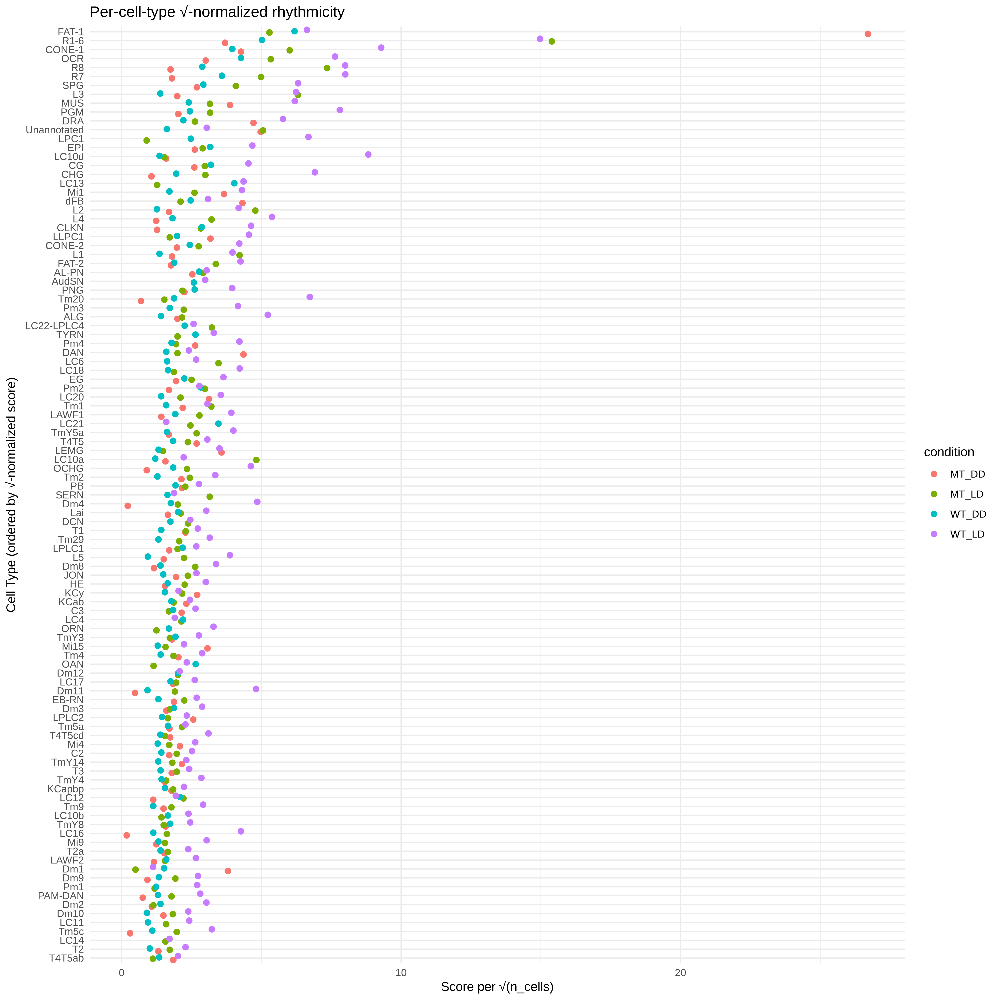

In [60]:
ggplot(df_scores, 
       aes(x = reorder(cell_type, score_per_sqrt), 
           y = score_per_sqrt, 
           color = condition)) +
  geom_point(size = 2, position = position_dodge(width = 0.6)) +
  coord_flip() +
  labs(
    x = "Cell Type (ordered by √-normalized score)",
    y = "Score per √(n_cells)",
    title = "Per-cell-type √-normalized rhythmicity"
  ) +
  theme_minimal()


  condition cell_type n_rhythmic n_cells rhythmicity_score log_n_cells
1     MT_DD     AL-PN         16      40        0.40000000    1.602060
2     MT_DD       ALG         33     273        0.12087912    2.436163
3     MT_DD        C2         31     331        0.09365559    2.519828
4     MT_DD        C3         38     313        0.12140575    2.495544
5     MT_DD        CG         34     171        0.19883041    2.232996
6     MT_DD       CHG         11     106        0.10377358    2.025306
  log_n_rhythmic rhythmicity_resid expected_rhythmic excess_rhythmic
1       1.230449        0.20046891           9.71470        6.285300
2       1.531479       -0.02488372          35.00499       -2.004985
3       1.505150       -0.10401190          39.65948       -8.659485
4       1.591065       -0.00277242          38.24976       -0.249762
5       1.544068        0.11591905          25.80088        8.199123
6       1.079181       -0.21789931          18.81895       -7.818946
  score_per_sqrt sco

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Global‐Normalized Residuals' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Global‐Normalized Residuals' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Global‐Normalized Residuals' in 'mbcsToSbcs': dot substituted for <90>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Global‐Norm Residual' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Global‐Norm Residual' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Global‐Norm Residu

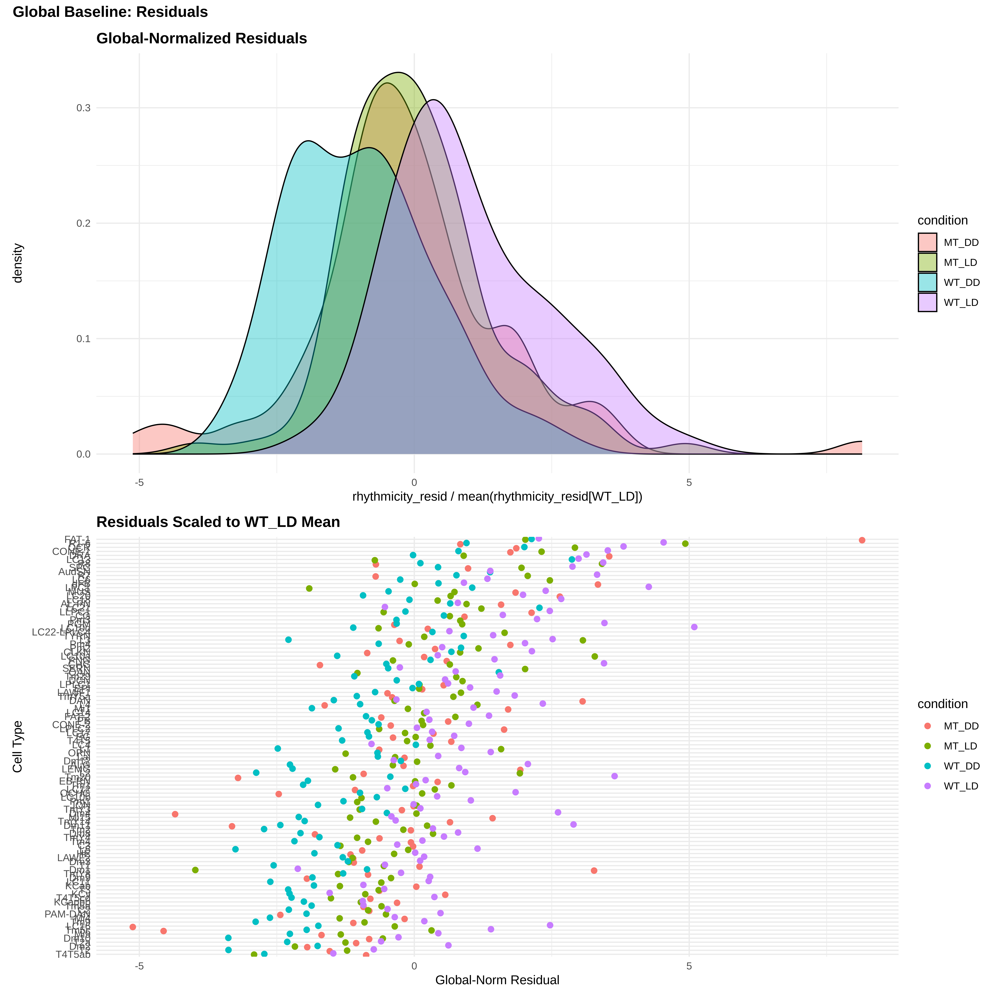

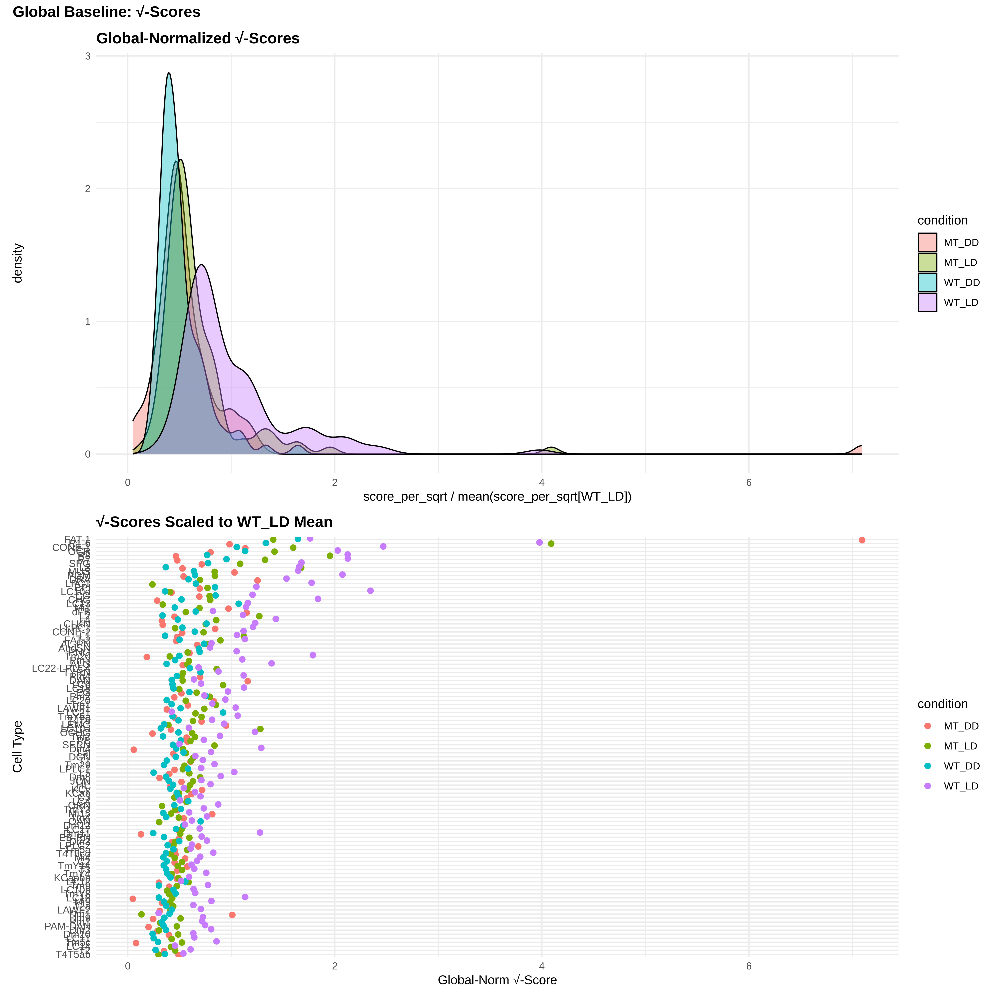

In [114]:
library(dplyr)
library(ggplot2)
library(patchwork)

# --- assume df_scores already has:
#    condition, cell_type, n_cells, n_rhythmic,
#    rhythmicity_resid, score_per_sqrt

# 1) compute WT_LD global means
baseline_global <- df_scores %>%
  filter(condition == "WT_LD") %>%
  summarise(
    mean_resid = mean(rhythmicity_resid, na.rm = TRUE),
    mean_sqrt  = mean(score_per_sqrt, na.rm = TRUE)
  )

# 2) add two new “global‐baseline‐normalized” columns
df_scores <- df_scores %>%
  mutate(
    norm_resid_global = rhythmicity_resid / baseline_global$mean_resid,
    norm_sqrt_global  = score_per_sqrt   / baseline_global$mean_sqrt
  )

# 3) quick peek
print(head(df_scores))

# —— plots —— #

# A) density of global‐norm residuals
p1 <- ggplot(df_scores, aes(x = norm_resid_global, fill = condition)) +
  geom_density(alpha = 0.4) +
  labs(
    x     = "rhythmicity_resid / mean(rhythmicity_resid[WT_LD])",
    title = "Global‐Normalized Residuals"
  ) +
  theme_minimal()

# B) dot‐plot of global‐norm residuals by cell type
p2 <- ggplot(df_scores,
             aes(x = reorder(cell_type, norm_resid_global),
                 y = norm_resid_global,
                 color = condition)) +
  geom_point(size = 2, position = position_dodge(0.6)) +
  coord_flip() +
  labs(
    x     = "Cell Type",
    y     = "Global‐Norm Residual",
    title = "Residuals Scaled to WT_LD Mean"
  ) +
  theme_minimal()

# C) density of global‐norm √‐scores
p3 <- ggplot(df_scores, aes(x = norm_sqrt_global, fill = condition)) +
  geom_density(alpha = 0.4) +
  labs(
    x     = "score_per_sqrt / mean(score_per_sqrt[WT_LD])",
    title = "Global‐Normalized √‐Scores"
  ) +
  theme_minimal()

# D) dot‐plot of global‐norm √‐scores by cell type
p4 <- ggplot(df_scores,
             aes(x = reorder(cell_type, norm_sqrt_global),
                 y = norm_sqrt_global,
                 color = condition)) +
  geom_point(size = 2, position = position_dodge(0.6)) +
  coord_flip() +
  labs(
    x     = "Cell Type",
    y     = "Global‐Norm √‐Score",
    title = "√‐Scores Scaled to WT_LD Mean"
  ) +
  theme_minimal()

# 4) display
(p1 / p2) + plot_annotation(title = "Global Baseline: Residuals") &
  theme(plot.title = element_text(face = "bold"))

(p3 / p4) + plot_annotation(title = "Global Baseline: √‐Scores") &
  theme(plot.title = element_text(face = "bold"))


In [115]:
library(dplyr)

# 1) Compute WT_LD global means
baseline_global <- df_scores %>%
  filter(condition == "WT_LD") %>%
  summarise(
    mean_resid = mean(rhythmicity_resid, na.rm = TRUE),
    mean_sqrt  = mean(score_per_sqrt,   na.rm = TRUE)
  )

# 2) Add the two global‐baseline‐normalized scores
df_scores <- df_scores %>%
  mutate(
    global_resid_score = rhythmicity_resid / baseline_global$mean_resid,
    global_sqrt_score  = score_per_sqrt   / baseline_global$mean_sqrt
  )

# 3) Select just the columns you need for export
df_export <- df_scores %>%
  select(
    condition,
    cell_type,
    global_resid_score,
    global_sqrt_score
  )

# 4) Write to CSV
write.csv(
  df_export,
  file = "corrected_rhythmicity_scores.csv",
  row.names = FALSE
)

# Now you can in Python:
#   import pandas as pd
#   df = pd.read_csv("corrected_rhythmicity_scores.csv")
# and map 'global_resid_score' or 'global_sqrt_score' onto your Scanpy UMAP.


`geom_smooth()` using formula = 'y ~ x'
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Log–Log relationship of cell count vs rhythmic genes' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Log–Log relationship of cell count vs rhythmic genes' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Log–Log relationship of cell count vs rhythmic genes' in 'mbcsToSbcs': dot substituted for <93>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Log–Log relationship of cell count vs rhythmic genes' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Log–Log relationship of cell count v

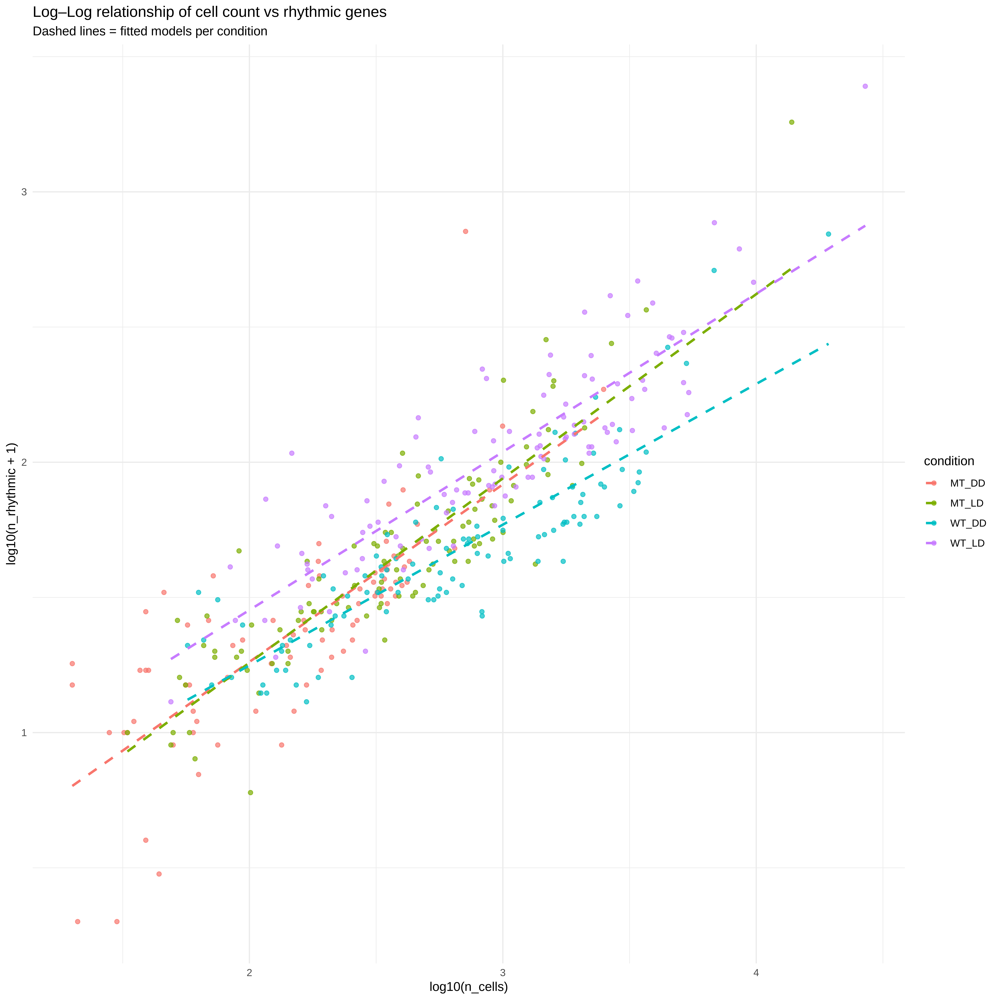

In [116]:
library(ggplot2)

# scatter of log10(cells) vs log10(rhythmic+1), colored by condition
p1 <- ggplot(df_scores, aes(x = log_n_cells, y = log_n_rhythmic, color = condition)) +
  geom_point(alpha = 0.7) +
  geom_smooth(method = "lm", se = FALSE, linetype = "dashed") +
  labs(
    x = "log10(n_cells)",
    y = "log10(n_rhythmic + 1)",
    title = "Log–Log relationship of cell count vs rhythmic genes",
    subtitle = "Dashed lines = fitted models per condition"
  ) +
  theme_minimal()
p1

# Running MetaCycle on unannotated rhythmic clusters

In [36]:
cds_aggregate_by_type

function (cds, types) 
{
    unique_types = unique(types)
    agg_cell_count = t(Matrix.utils::aggregate.Matrix(t(exprs(cds)), 
        as.factor(types)))
    colnames(agg_cell_count) = as.character(colnames(agg_cell_count))
    df_cell = data.frame(sample = colnames(agg_cell_count))
    df_gene = fData(cds)
    cds = cds_construct(agg_cell_count, df_cell, df_gene)
    return(cds)
}
<bytecode: 0x55b0839c0410>

In [18]:
# Define your six target clusters
target_clusters <- c("25-150","25-238","75-231","10-180","25-216","8-145")

# Function to subset cds by condition + cluster
subset_by_cluster <- function(cds, rescol, cluster_id) {
  # e.g., rescol = "leiden_res_25.00_neuron"
  parts <- strsplit(cluster_id, "-")[[1]]
  res   <- parts[1]
  clus  <- parts[2]
  rescol <- paste0("leiden_res_", res, ".00_neuron")
  
  cds_sub <- cds[, cds[[rescol]] == clus]
  return(cds_sub)
}


In [43]:
# ============================================================
# MetaCycle per Leiden cluster × condition (robust full script)
# ============================================================

suppressPackageStartupMessages({
  library(monocle)    # exprs(), pData(), fData()
  library(Matrix)     # sparse handling
  library(tibble)     # rownames_to_column()
  library(MetaCycle)  # meta2d()
})

# -----------------------------
# User inputs / existing objects
# -----------------------------
# Assumes you already defined:
#   wtzt <- cds[,(cds$light_condition == "LD") & (cds$genotype == "Wild-type")]
#   wtct <- cds[,(cds$light_condition == "DD") & (cds$genotype == "Wild-type")]
#   mtzt <- cds[,(cds$light_condition == "LD") & (cds$genotype == "per0"  | cds$genotype == "per01")]
#   mtct <- cds[,(cds$light_condition == "DD") & (cds$genotype == "per0"  | cds$genotype == "per01")]

target_clusters <- c("25-150","25-238","75-231","10-180","25-216","8-145")
conditions <- list(
  WTLD = wtzt,
  WTDD = wtct,
  MTLD = mtzt,
  MTDD = mtct
)

# -----------------------------
# Helpers
# -----------------------------

# 1) Find a timepoint column
get_time_labels <- function(cds_obj) {
  pd <- pData(cds_obj)
  if ("new_timepoint" %in% colnames(pd)) {
    as.character(pd$new_timepoint)
  } else if ("timepoint" %in% colnames(pd)) {
    as.character(pd$timepoint)
  } else {
    stop("No 'new_timepoint' or 'timepoint' in pData(cds).")
  }
}

# 2) Subset by Leiden "<res>-<cluster>" using *_neuron columns
subset_by_cluster <- function(cds_obj, cluster_id) {
  parts <- strsplit(cluster_id, "-")[[1]]
  res   <- parts[1]
  clus  <- parts[2]
  rescol <- paste0("leiden_res_", res, ".00_neuron")
  if (!rescol %in% colnames(pData(cds_obj))) {
    stop("Resolution column not found: ", rescol)
  }
  cds_obj[, pData(cds_obj)[[rescol]] == clus]
}

# 3) Assign 2 pseudoreplicates within each time label and compute Sum2 (0–48)
assign_pseudoreps_and_sum2 <- function(cds_obj, K = 2, seed = 1L) {
  tp <- get_time_labels(cds_obj)
  if (length(tp) != ncol(cds_obj)) stop("Time vector length mismatch.")
  set.seed(seed)
  idx_by_tp <- split(seq_along(tp), tp)
  rep_id <- integer(length(tp))
  for (lev in names(idx_by_tp)) {
    idx <- idx_by_tp[[lev]]
    ids <- rep(seq_len(K), length.out = length(idx))
    rep_id[idx] <- sample(ids)
  }
  pData(cds_obj)$pseudo_replicate <- paste0(tp, "_", rep_id)

  # --- vectorized hour extraction ---
  extract_hour <- function(x) {
    x <- as.character(x)
    has_tag <- grepl("(ZT|CT)[0-9]+", x, perl = TRUE)
    out <- suppressWarnings(as.numeric(gsub("\\D", "", x)))   # any digits
    if (any(has_tag)) {
      out[has_tag] <- suppressWarnings(
        as.numeric(sub(".*(ZT|CT)([0-9]+).*", "\\2", x[has_tag], perl = TRUE))
      )
    }
    out
  }

  base_tp <- extract_hour(tp)
  if (any(is.na(base_tp))) {
    bad <- unique(tp[is.na(base_tp)])
    stop("Failed to parse numeric hours from timepoint labels, e.g.: ",
         paste(utils::head(bad, 5), collapse = ", "))
  }
  offset <- ifelse(rep_id == 1, 0, 24)
  pData(cds_obj)$Sum2 <- as.character(base_tp + offset)
  cds_obj
}

# 4) Robust aggregation genes×cells -> genes×groups by group labels
aggregate_counts_by <- function(cds_obj, group_labels) {
  grp <- as.character(group_labels)
  if (length(grp) != ncol(cds_obj))
    stop("Grouping vector length (", length(grp), ") != ncol(cds) (", ncol(cds_obj), ").")
  if (anyNA(grp))
    stop("Grouping vector contains NA; cannot aggregate.")

  # make sure pData aligns to exprs columns
  if (!identical(rownames(pData(cds_obj)), colnames(exprs(cds_obj)))) {
    pData(cds_obj) <- pData(cds_obj)[colnames(exprs(cds_obj)), , drop = FALSE]
    if (!identical(rownames(pData(cds_obj)), colnames(exprs(cds_obj)))) {
      stop("pData rownames do not align with exprs colnames.")
    }
  }

  M <- exprs(cds_obj)                         # genes × cells
  f <- factor(grp)
  # rowsum on transposed matrix (cells grouped), then transpose back
  summed <- t(rowsum(t(as.matrix(M)), group = f))   # genes × groups
  colnames(summed) <- levels(f)
  rownames(summed) <- rownames(M)
  summed
}

# 5) CPM + log1p
cpm_log1p <- function(mat_counts) {
  cs <- colSums(mat_counts)
  cs[cs == 0] <- 1
  log1p(t(t(mat_counts) / cs) * 1e6)
}

# 6) One complete run for a cds subset (already filtered to a single cluster)
metacycle_on_cluster <- function(cds_cluster, label, cluster_id,
                                 outdir_base = "MetaCycle_Clusters",
                                 minper = 24, maxper = 24) {
  if (ncol(cds_cluster) < 5) {
    message("Too few cells for ", label, " ", cluster_id, " — skipping.")
    return(NULL)
  }
  cds_cluster <- assign_pseudoreps_and_sum2(cds_cluster, K = 2, seed = 1L)

  # aggregate by Sum2
  mat_counts <- aggregate_counts_by(cds_cluster, pData(cds_cluster)$Sum2)

  # gene names
  gnames <- if ("gene_short_name" %in% colnames(fData(cds_cluster))) {
    if (nrow(fData(cds_cluster)) == nrow(mat_counts)) fData(cds_cluster)$gene_short_name
    else rownames(mat_counts)
  } else rownames(mat_counts)
  rownames(mat_counts) <- gnames

  # order columns by numeric time
  times_num <- as.numeric(colnames(mat_counts))
  ord <- order(times_num)
  mat_counts <- mat_counts[, ord, drop = FALSE]
  times_num  <- times_num[ord]

  # normalize
  mat_log <- cpm_log1p(mat_counts)

  # prepare DataFrame for MetaCycle
  df <- as.data.frame(as.matrix(mat_log))
  df <- tibble::rownames_to_column(df, var = "Gene")

  # run MetaCycle
  odir <- file.path(outdir_base, paste0(label, "_", gsub("[^0-9_-]", "", cluster_id)))
  dir.create(odir, showWarnings = FALSE, recursive = TRUE)

  res <- tryCatch({
    MetaCycle::meta2d(
      infile     = "inmemory",
      inDF       = df,
      outdir     = odir,
      filestyle  = "txt",
      timepoints = times_num,
      cycMethod  = c("JTK","ARS","LS"),
      minper     = minper,
      maxper     = maxper,
      outputFile = FALSE
    )
  }, error = function(e) {
    message("MetaCycle error for ", label, " ", cluster_id, ": ", e$message)
    NULL
  })

  res
}

# -----------------------------
# Run all clusters × conditions
# -----------------------------
results_all <- list()

for (cond in names(conditions)) {
  cds_cond <- conditions[[cond]]
  for (clus in target_clusters) {
    message("Running ", cond, " cluster ", clus)
    cds_sub <- tryCatch(
      subset_by_cluster(cds_cond, clus),
      error = function(e) { message("Subset error: ", e$message); NULL }
    )
    if (is.null(cds_sub) || ncol(cds_sub) == 0) {
      message("No cells for ", cond, " ", clus, " — skipping.")
      next
    }
    res <- metacycle_on_cluster(cds_sub, cond, clus,
                                outdir_base = "MetaCycle_Clusters",
                                minper = 24, maxper = 24)
    results_all[[paste0(cond, "_", clus)]] <- res
  }
}

# Save R object
saveRDS(results_all, "MetaCycle_clusters_results_3.rds")



Running WTLD cluster 25-150



The ARS is in process from  06:04:47 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:07:03 PM 09-29-2025 
The JTK is in process from  06:07:03 PM 09-29-2025 
The analysis by JTK is finished at  06:07:10 PM 09-29-2025 
The LS is in process from  06:07:10 PM 09-29-2025 
The analysis by LS is finished at  06:09:22 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                user.self     sys.self      elapsed   user.child    sys.child 
"Time used:"    "281.001"      "0.125"    "282.141"          "0"          "0" 




Running WTLD cluster 25-238



The ARS is in process from  06:09:29 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:11:19 PM 09-29-2025 
The JTK is in process from  06:11:19 PM 09-29-2025 
The analysis by JTK is finished at  06:11:26 PM 09-29-2025 
The LS is in process from  06:11:26 PM 09-29-2025 
The analysis by LS is finished at  06:13:44 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "259.833000000001" "0.121000000000002"           "260.944" 
         user.child           sys.child 
                "0"                 "0" 




Running WTLD cluster 75-231



The ARS is in process from  06:13:51 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:15:56 PM 09-29-2025 
The JTK is in process from  06:15:56 PM 09-29-2025 
The analysis by JTK is finished at  06:16:03 PM 09-29-2025 
The LS is in process from  06:16:03 PM 09-29-2025 
The analysis by LS is finished at  06:18:17 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "271.058999999999" "0.114000000000001"  "272.923999999999" 
         user.child           sys.child 
                "0"                 "0" 




Running WTLD cluster 10-180



The ARS is in process from  06:18:24 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:19:25 PM 09-29-2025 
The JTK is in process from  06:19:25 PM 09-29-2025 
The analysis by JTK is finished at  06:19:32 PM 09-29-2025 
The LS is in process from  06:19:32 PM 09-29-2025 
The analysis by LS is finished at  06:22:01 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                                user.self             sys.self 
        "Time used:"            "221.136" "0.0960000000000001" 
             elapsed           user.child            sys.child 
  "222.008000000002"                  "0"                  "0" 




Running WTLD cluster 25-216



The ARS is in process from  06:22:06 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:24:03 PM 09-29-2025 
The JTK is in process from  06:24:03 PM 09-29-2025 
The analysis by JTK is finished at  06:24:09 PM 09-29-2025 
The LS is in process from  06:24:09 PM 09-29-2025 
The analysis by LS is finished at  06:26:25 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                            user.self           sys.self            elapsed 
      "Time used:" "264.620999999999"            "0.122" "265.690999999999" 
        user.child          sys.child 
               "0"                "0" 




Running WTLD cluster 8-145



The ARS is in process from  06:26:32 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:28:11 PM 09-29-2025 
The JTK is in process from  06:28:11 PM 09-29-2025 
The analysis by JTK is finished at  06:28:18 PM 09-29-2025 
The LS is in process from  06:28:18 PM 09-29-2025 
The analysis by LS is finished at  06:30:40 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "252.208000000001" "0.114999999999998"  "253.227000000003" 
         user.child           sys.child 
                "0"                 "0" 




Running WTDD cluster 25-150



The ARS is in process from  06:30:46 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:32:42 PM 09-29-2025 
The JTK is in process from  06:32:42 PM 09-29-2025 
The analysis by JTK is finished at  06:32:50 PM 09-29-2025 
The LS is in process from  06:32:50 PM 09-29-2025 
The analysis by LS is finished at  06:35:08 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "266.861999999999" "0.116999999999997"  "268.044999999998" 
         user.child           sys.child 
                "0"                 "0" 




Running WTDD cluster 25-238



The ARS is in process from  06:35:14 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:36:47 PM 09-29-2025 
The JTK is in process from  06:36:47 PM 09-29-2025 
The analysis by JTK is finished at  06:36:54 PM 09-29-2025 
The LS is in process from  06:36:54 PM 09-29-2025 
The analysis by LS is finished at  06:39:18 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"           "247.328" "0.118000000000002"  "249.011000000002" 
         user.child           sys.child 
                "0"                 "0" 




Running WTDD cluster 75-231



The ARS is in process from  06:39:24 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:41:04 PM 09-29-2025 
The JTK is in process from  06:41:04 PM 09-29-2025 
The analysis by JTK is finished at  06:41:11 PM 09-29-2025 
The LS is in process from  06:41:11 PM 09-29-2025 
The analysis by LS is finished at  06:43:32 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "253.387000000001" "0.132999999999999"           "254.429" 
         user.child           sys.child 
                "0"                 "0" 




Running WTDD cluster 10-180



The LS is in process from  06:43:39 PM 09-29-2025 
The analysis by LS is finished at  06:46:12 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                                user.self             sys.self 
        "Time used:"   "154.792000000001" "0.0360000000000014" 
             elapsed           user.child            sys.child 
  "155.472000000002"                  "0"                  "0" 




Running WTDD cluster 25-216



The ARS is in process from  06:46:14 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:47:49 PM 09-29-2025 
The JTK is in process from  06:47:49 PM 09-29-2025 
The analysis by JTK is finished at  06:47:56 PM 09-29-2025 
The LS is in process from  06:47:56 PM 09-29-2025 
The analysis by LS is finished at  06:50:19 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "249.763000000003" "0.114999999999998"           "250.767" 
         user.child           sys.child 
                "0"                 "0" 




Running WTDD cluster 8-145



The ARS is in process from  06:50:25 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:51:46 PM 09-29-2025 
The JTK is in process from  06:51:46 PM 09-29-2025 
The analysis by JTK is finished at  06:51:53 PM 09-29-2025 
The LS is in process from  06:51:53 PM 09-29-2025 
The analysis by LS is finished at  06:54:20 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "239.306999999997" "0.112000000000002"  "240.278999999999" 
         user.child           sys.child 
                "0"                 "0" 




Running MTLD cluster 25-150



The ARS is in process from  06:54:26 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  06:56:25 PM 09-29-2025 
The JTK is in process from  06:56:25 PM 09-29-2025 
The analysis by JTK is finished at  06:56:32 PM 09-29-2025 
The LS is in process from  06:56:32 PM 09-29-2025 
The analysis by LS is finished at  06:58:50 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "269.650999999998" "0.120999999999999"  "270.745000000003" 
         user.child           sys.child 
                "0"                 "0" 




Running MTLD cluster 25-238



The ARS is in process from  06:58:57 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  07:00:15 PM 09-29-2025 
The JTK is in process from  07:00:15 PM 09-29-2025 
The analysis by JTK is finished at  07:00:22 PM 09-29-2025 
The LS is in process from  07:00:22 PM 09-29-2025 
The analysis by LS is finished at  07:02:49 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                user.self     sys.self      elapsed   user.child    sys.child 
"Time used:"    "236.661"      "0.119"    "237.623"          "0"          "0" 




Running MTLD cluster 75-231



The ARS is in process from  07:02:54 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  07:04:32 PM 09-29-2025 
The JTK is in process from  07:04:32 PM 09-29-2025 
The analysis by JTK is finished at  07:04:39 PM 09-29-2025 
The LS is in process from  07:04:39 PM 09-29-2025 
The analysis by LS is finished at  07:07:02 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "252.580999999998" "0.114000000000001"  "253.631000000001" 
         user.child           sys.child 
                "0"                 "0" 




Running MTLD cluster 10-180



The ARS is in process from  07:07:08 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  07:08:01 PM 09-29-2025 
The JTK is in process from  07:08:01 PM 09-29-2025 
The analysis by JTK is finished at  07:08:07 PM 09-29-2025 
The LS is in process from  07:08:07 PM 09-29-2025 
The analysis by LS is finished at  07:10:40 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"           "215.304" "0.118000000000002"  "216.175999999999" 
         user.child           sys.child 
                "0"                 "0" 




Running MTLD cluster 25-216



The ARS is in process from  07:10:45 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  07:12:22 PM 09-29-2025 
The JTK is in process from  07:12:22 PM 09-29-2025 
The analysis by JTK is finished at  07:12:29 PM 09-29-2025 
The LS is in process from  07:12:29 PM 09-29-2025 
The analysis by LS is finished at  07:14:53 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                            user.self           sys.self            elapsed 
      "Time used:"          "252.873"            "0.128" "253.901999999998" 
        user.child          sys.child 
               "0"                "0" 




Running MTLD cluster 8-145



The ARS is in process from  07:14:59 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  07:16:16 PM 09-29-2025 
The JTK is in process from  07:16:16 PM 09-29-2025 
The analysis by JTK is finished at  07:16:23 PM 09-29-2025 
The LS is in process from  07:16:23 PM 09-29-2025 
The analysis by LS is finished at  07:18:52 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"  "237.914000000001" "0.120999999999999"           "238.928" 
         user.child           sys.child 
                "0"                 "0" 




Running MTDD cluster 25-150



The ARS is in process from  07:18:58 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  07:20:08 PM 09-29-2025 
The JTK is in process from  07:20:08 PM 09-29-2025 
The analysis by JTK is finished at  07:20:15 PM 09-29-2025 
The LS is in process from  07:20:15 PM 09-29-2025 
The analysis by LS is finished at  07:22:46 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                            user.self           sys.self            elapsed 
      "Time used:"          "231.141"            "0.093" "232.705000000002" 
        user.child          sys.child 
               "0"                "0" 




Running MTDD cluster 25-238



The LS is in process from  07:22:51 PM 09-29-2025 
The analysis by LS is finished at  07:25:27 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                                user.self             sys.self 
        "Time used:"   "156.905999999999" "0.0389999999999979" 
             elapsed           user.child            sys.child 
  "157.489999999998"                  "0"                  "0" 




Running MTDD cluster 75-231



The ARS is in process from  07:25:28 PM 09-29-2025 


Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“possible convergence problem: optim gave code = 1”
Warning message in arima0(x, order = c(order, 0L, 0L), include.mean = demean):
“pos

The analysis by ARS is finished at  07:26:26 PM 09-29-2025 
The JTK is in process from  07:26:26 PM 09-29-2025 
The analysis by JTK is finished at  07:26:34 PM 09-29-2025 
The LS is in process from  07:26:34 PM 09-29-2025 
The analysis by LS is finished at  07:29:07 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                              user.self            sys.self             elapsed 
       "Time used:"           "222.519" "0.103999999999999"  "223.403999999999" 
         user.child           sys.child 
                "0"                 "0" 




Running MTDD cluster 10-180



The LS is in process from  07:29:12 PM 09-29-2025 
The analysis by LS is finished at  07:29:19 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                                user.self             sys.self 
        "Time used:"   "7.73799999999756" "0.0960000000000001" 
             elapsed           user.child            sys.child 
  "7.85900000000038"                  "0"                  "0" 




Running MTDD cluster 25-216



The LS is in process from  07:29:20 PM 09-29-2025 
The analysis by LS is finished at  07:31:55 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                                user.self             sys.self 
        "Time used:"   "156.632000000001" "0.0510000000000019" 
             elapsed           user.child            sys.child 
  "157.224999999999"                  "0"                  "0" 




Running MTDD cluster 8-145



The LS is in process from  07:31:57 PM 09-29-2025 
The analysis by LS is finished at  07:34:33 PM 09-29-2025 
DONE! The analysis about ' inmemory '  has been finished.
                                user.self             sys.self 
        "Time used:"            "157.035" "0.0459999999999994" 
             elapsed           user.child            sys.child 
           "157.624"                  "0"                  "0" 




In [11]:
results_all_1 <- readRDS("MetaCycle_clusters_results.rds")
results_all_2 <- readRDS("MetaCycle_clusters_results_2.rds")
results_all_3 <- readRDS("MetaCycle_clusters_results_3.rds")

In [15]:
head(results_all_1$`WTLD_8-145`$meta)

,CycID,ARS_pvalue,ARS_BH.Q,ARS_period,ARS_adjphase,ARS_amplitude,JTK_pvalue,JTK_BH.Q,JTK_period,JTK_adjphase,⋯,LS_period,LS_adjphase,LS_amplitude,meta2d_pvalue,meta2d_BH.Q,meta2d_period,meta2d_phase,meta2d_Base,meta2d_AMP,meta2d_rAMP
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,128up,1.00000000,1,NA,NA,0.00000000,1.0000000,1,0,NaN,⋯,NA,NA,0.000000,1.00000000,1,NA,NA,0.0000000,NA,NA
2,14-3-3epsilon,0.63051417,1,24,2.91788,0.22471349,0.6957053,1,24,6,⋯,24,1.550737e-01,6.508654,0.94833509,1,24,3.012176,6.2507401,0.2664371673,0.0426248993
3,14-3-3zeta,0.34235624,1,24,15.25840,0.20863855,0.9155428,1,24,18,⋯,24,1.255123e+01,7.420973,0.86172323,1,24,15.268763,7.1415780,0.2488986846,0.0348520570
4,140up,0.67613250,1,24,16.00000,0.32894362,1.0000000,1,0,NaN,⋯,24,1.038707e+01,0.000000,0.99112008,1,24,13.193536,0.2642637,0.2689304980,0.2689304980
5,18SrRNA-Psi:CR41602,0.98858465,1,24,12.14494,0.02050847,1.0000000,1,24,6,⋯,24,5.949113e-05,7.367815,0.99999972,1,24,5.997142,6.8671330,0.0009076693,0.0001321759
6,18SrRNA-Psi:CR45861,0.05442386,1,24,20.54996,0.33203246,0.1258821,1,24,22,⋯,24,1.899040e+01,8.494058,0.07847217,1,24,20.514434,8.3570319,0.3402283957,0.0407116307


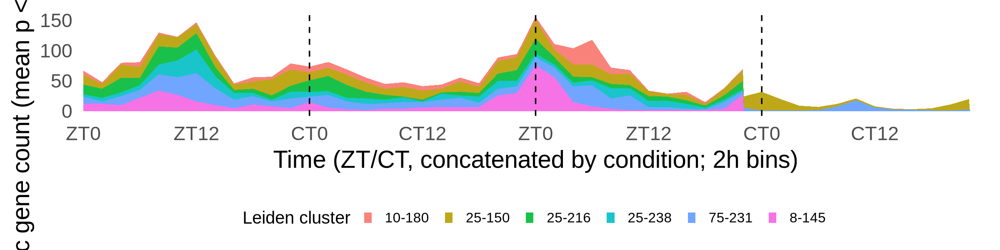

In [18]:
suppressPackageStartupMessages({
  library(dplyr)
  library(purrr)
  library(tidyr)
  library(ggplot2)
  library(stringr)
})

# --- inputs ----------------------------------------------------------
results_all_1 <- readRDS("MetaCycle_clusters_results.rds")
results_all_2 <- readRDS("MetaCycle_clusters_results_2.rds")
results_all_3 <- readRDS("MetaCycle_clusters_results_3.rds")

target_clusters <- c("25-150","25-238","75-231","10-180","25-216","8-145")
cond_levels     <- c("WTLD","WTDD","MTLD","MTDD")

# --- helpers ---------------------------------------------------------

# accept either a DF or a list with $meta; return (id, phase, p)
get_meta_df <- function(x) {
  df <- if (is.list(x) && "meta" %in% names(x)) x$meta else x
  stopifnot(is.data.frame(df))
  nm <- names(df)
  id_col    <- if ("CycID" %in% nm) "CycID" else if ("Gene" %in% nm) "Gene" else nm[1]
  phase_col <- if ("meta2d_phase" %in% nm) "meta2d_phase" else if ("phase" %in% nm) "phase" else stop("No phase column found.")
  p_col     <- if ("meta2d_pvalue" %in% nm) "meta2d_pvalue" else if ("pvalue" %in% nm) "pvalue" else stop("No p-value column found.")

  tibble(
    id    = as.character(df[[id_col]]),
    phase = suppressWarnings(as.numeric(df[[phase_col]])),
    p     = suppressWarnings(as.numeric(df[[p_col]]))
  ) %>% distinct(id, .keep_all = TRUE)
}

# circular mean on [0,24)
circ_mean_24 <- function(x) {
  x <- x %% 24
  ang <- x / 24 * 2*pi
  mu  <- atan2(mean(sin(ang), na.rm=TRUE), mean(cos(ang), na.rm=TRUE))
  if (is.na(mu)) return(NA_real_)
  if (mu < 0) mu <- mu + 2*pi
  (mu / (2*pi)) * 24
}

# combine 3 runs for a single (cond × cluster) using mean p and circular mean phase
combine_meanp <- function(r1, r2, r3) {
  t1 <- get_meta_df(r1); t2 <- get_meta_df(r2); t3 <- get_meta_df(r3)
  out <- full_join(t1, t2, by="id", suffix=c(".r1",".r2")) %>%
    full_join(t3, by="id") %>%
    rename(phase.r3 = phase, p.r3 = p)

  out %>%
    rowwise() %>%
    mutate(
      phase_avg = circ_mean_24(c(phase.r1, phase.r2, phase.r3)),
      p_avg     = mean(c(p.r1, p.r2, p.r3), na.rm = TRUE)
    ) %>%
    ungroup() %>%
    select(id, phase_avg, p_avg)
}

# parse "WTLD_8-145" → condition + cluster
parse_name <- function(nm) {
  bits <- strsplit(nm, "_", fixed=TRUE)[[1]]
  list(cond = bits[1], clus = bits[2])
}

# 2-h bin and condition offsets for 0–96 concat
bin2h <- function(x) floor((x %% 24) / 2) * 2
cond_offset <- function(cond) switch(cond, WTLD=0, WTDD=24, MTLD=48, MTDD=72, 0)

# --- build tidy counts -----------------------------------------------------

# keys present in all three runs
keys_all <- Reduce(intersect, list(names(results_all_1), names(results_all_2), names(results_all_3)))
# restrict to six clusters × four conditions
want     <- unlist(lapply(cond_levels, function(C) paste0(C, "_", target_clusters)))
keys     <- intersect(keys_all, want)

if (length(keys) == 0) stop("No matching (condition × cluster) entries found in the three RDS files.")

# mean p cutoff
alpha <- 0.05

tidy_counts <- map_dfr(keys, function(k) {
  r1 <- results_all_1[[k]]; r2 <- results_all_2[[k]]; r3 <- results_all_3[[k]]
  if (is.null(r1) || is.null(r2) || is.null(r3)) return(NULL)

  comb <- try(combine_meanp(r1, r2, r3), silent = TRUE)
  if (inherits(comb, "try-error") || nrow(comb) == 0) return(NULL)

  parts <- parse_name(k)
  cond  <- parts$cond
  clus  <- parts$clus

  comb %>%
    filter(!is.na(phase_avg), !is.na(p_avg), p_avg < alpha) %>%
    mutate(
      phase_bin = bin2h(phase_avg),
      n = 1L
    ) %>%
    group_by(phase_bin) %>%
    summarise(n = sum(n), .groups="drop") %>%
    mutate(
      condition = factor(cond, levels = cond_levels),
      cluster   = clus,
      time      = phase_bin + cond_offset(cond)
    )
})

# quick sanity
if (nrow(tidy_counts) == 0) {
  msg <- "No genes passed mean-p < 0.05 after combining runs.\nTry alpha <- 0.1, or inspect a specific entry like:\nhead(get_meta_df(results_all_1[['WTLD_8-145']]))"
  stop(msg)
}

# --- plot ------------------------------------------------------------

p <- ggplot(tidy_counts, aes(x = time, y = n, fill = cluster)) +
  geom_area(position = "stack", alpha = 0.9) +
  geom_vline(xintercept = c(24, 48, 72), linetype = "dashed", linewidth = 0.4) +
  scale_x_continuous(
    breaks = seq(0, 96, 12),
    labels = c("ZT0","ZT12","CT0","CT12","ZT0","ZT12","CT0","CT12",""),
    limits = c(0, 96), expand = c(0, 0)
  ) +
  labs(
    x = "Time (ZT/CT, concatenated by condition; 2h bins)",
    y = "Rhythmic gene count (mean p < 0.05 across 3 runs)",
    fill = "Leiden cluster"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    panel.grid      = element_blank(),
    legend.position = "bottom",
    legend.key.size = unit(0.4, "lines"),
    legend.title    = element_text(size = 10),
    legend.text     = element_text(size = 8)
  ) +
  guides(fill = guide_legend(ncol = 6, byrow = TRUE))

print(p)


In [17]:
options(repr.plot.width = 8,   # width in inches
        repr.plot.height = 2,  # height in inches
        repr.plot.res = 300)   # resolution in DPI


In [23]:
suppressPackageStartupMessages({
  library(dplyr)
  library(purrr)
  library(stringr)
  library(tibble)
})

# --- load your three runs ---
results_all_1 <- readRDS("MetaCycle_clusters_results.rds")
results_all_2 <- readRDS("MetaCycle_clusters_results_2.rds")
results_all_3 <- readRDS("MetaCycle_clusters_results_3.rds")

# --- settings ---
conds    <- c("WTLD","WTDD","MTLD","MTDD")
clusters <- c("25-150","25-238","75-231","10-180","25-216","8-145")
alpha    <- 0.05
out_prefix <- "MetaCycleAvg"  # files: MetaCycleAvg_WTLD_combined.csv, etc.

# ---------- helpers (robust to column name variants) ----------
circ_mean_24 <- function(x) {
  x <- as.numeric(x); x <- x[!is.na(x)]
  if (!length(x)) return(NA_real_)
  ang <- (x %% 24) / 24 * 2*pi
  mu  <- atan2(mean(sin(ang)), mean(cos(ang)))
  if (is.na(mu)) return(NA_real_)
  if (mu < 0) mu <- mu + 2*pi
  (mu / (2*pi)) * 24
}

unwrap_meta <- function(x) {
  if (is.null(x)) return(NULL)
  if (is.list(x) && "meta" %in% names(x)) return(x$meta)
  if (is.data.frame(x)) return(x)
  NULL
}

get_meta_df_robust <- function(df) {
  if (is.null(df) || !is.data.frame(df) || nrow(df) == 0)
    return(tibble(id=character(), phase=numeric(), p=numeric()))
  cn <- colnames(df)

  # ID col preference
  id_col <- dplyr::first(c("CycID","Gene")[c("CycID","Gene") %in% cn])
  if (is.na(id_col)) id_col <- cn[1]

  # phase columns
  phase_meta    <- intersect(c("meta2d_phase","phase","Phase"), cn)
  phase_methods <- setdiff(cn[grepl("(_phase|_Phase)$", cn)], phase_meta)

  # p-value columns
  p_meta    <- intersect(c("meta2d_pvalue","pvalue","Pvalue","PValue","meta2d_p","p"), cn)
  p_methods <- setdiff(cn[grepl("(_pvalue|_Pvalue|_PValue|_p)$", cn)], p_meta)

  if (length(phase_meta)) {
    phase_vec <- suppressWarnings(as.numeric(df[[phase_meta[1]]]))
  } else if (length(phase_methods)) {
    mat <- suppressWarnings(as.data.frame(lapply(phase_methods, \(c) as.numeric(df[[c]]))))
    phase_vec <- apply(as.matrix(mat), 1, circ_mean_24)
  } else {
    phase_vec <- rep(NA_real_, nrow(df))
  }

  if (length(p_meta)) {
    p_vec <- suppressWarnings(as.numeric(df[[p_meta[1]]]))
  } else if (length(p_methods)) {
    matp <- suppressWarnings(as.data.frame(lapply(p_methods, \(c) as.numeric(df[[c]]))))
    p_vec <- apply(as.matrix(matp), 1, \(v) mean(v, na.rm=TRUE))
  } else {
    p_vec <- rep(NA_real_, nrow(df))
  }

  tibble(
    CycID    = as.character(df[[id_col]]),
    phase = as.numeric(phase_vec),
    p     = as.numeric(p_vec)
  ) %>% distinct(CycID, .keep_all = TRUE)
}

combine_three_runs_meanp <- function(r1, r2, r3) {
  t1 <- get_meta_df_robust(unwrap_meta(r1))
  t2 <- get_meta_df_robust(unwrap_meta(r2))
  t3 <- get_meta_df_robust(unwrap_meta(r3))

  if (nrow(t1)==0 && nrow(t2)==0 && nrow(t3)==0)
    return(tibble(CycID=character(), phase_avg=numeric(), p_avg=numeric()))

  out <- full_join(t1, t2, by="CycID", suffix=c(".r1",".r2")) %>%
         full_join(t3, by="CycID") %>%
         rename(phase.r3=phase, p.r3=p) %>%
         rowwise() %>%
         mutate(
           avg_phase = circ_mean_24(c(phase.r1, phase.r2, phase.r3)),
           p_avg     = mean(c(p.r1, p.r2, p.r3), na.rm=TRUE)
         ) %>%
         ungroup() %>%
         select(CycID, avg_phase, p_avg)
  out
}

# ---------- combine & save by condition ----------
combine_and_save_by_condition <- function(res1, res2, res3, conds, clusters, alpha=0.05, out_prefix="MetaCycleAvg") {
  for (cond in conds) {
    # build keys for this condition
    keys <- paste0(cond, "_", clusters)
    # only retain keys present in all 3 runs
    keys <- Reduce(intersect, list(
      keys, names(res1), names(res2), names(res3)
    ))

    if (!length(keys)) {
      message("No overlapping keys for condition ", cond, "; skipping.")
      next
    }

    # combine across clusters for this condition
    df_cond <- map_dfr(keys, function(k) {
      r1 <- res1[[k]]; r2 <- res2[[k]]; r3 <- res3[[k]]
      comb <- combine_three_runs_meanp(r1, r2, r3)
      if (!nrow(comb)) return(NULL)

      # cluster label and cell_type = number after the dash
      clus <- sub("^.*_", "", k)                # e.g., "8-145"
      cell_type_num <- sub("^.*-", "", clus)    # e.g., "145"

      comb %>%
        filter(!is.na(p_avg), p_avg < alpha) %>%
        mutate(
          condition = cond,
          cluster   = clus,
          cell_type = cell_type_num
        ) %>%
        select(CycID, avg_phase, p_avg, cell_type, cluster, condition)
    })

    if (!nrow(df_cond)) {
      message("No genes passed mean-p <", alpha, " for ", cond, "; writing empty file.")
      df_cond <- tibble(CycID=character(), avg_phase=numeric(), p_avg=numeric(),
                        cell_type=character(), cluster=character(), condition=character())
    }

    fname <- paste0(out_prefix, "_", cond, "_combined.csv")
    write.csv(df_cond, fname, row.names = FALSE)
    message("Wrote: ", fname, " (", nrow(df_cond), " rows)")
  }
}

# --- run it ---
combine_and_save_by_condition(results_all_1, results_all_2, results_all_3,
                              conds, clusters, alpha = alpha, out_prefix = out_prefix)


Wrote: MetaCycleAvg_WTLD_combined.csv (1006 rows)

Wrote: MetaCycleAvg_WTDD_combined.csv (652 rows)

Wrote: MetaCycleAvg_MTLD_combined.csv (838 rows)

Wrote: MetaCycleAvg_MTDD_combined.csv (140 rows)

